# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

<h3 style="color:Brown">Business Understanding</h3> 
From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

---

<h4 style="color:Blue">Development</h4> 
Given a quantity of data (426000 records) with information on the variables of a vehicle (displacement, odometer, model, etc.) and given the selling price of the vehicle, we will determine, using the appropriate tools(k-means, linear regression, etc), which features (phi) have the most weight at the time of predicting the values. For this task we have several tools that allow us to glimpse more clearly the objective we are looking for.

The objectives are as follows:
<ul>
    <li>Find the features(phi) that most influence price.</li>
    <li>To find the best model to predict the price of vehicles.</li>
</ul>


<h3 style="color:Brown">Data Understanding</h3> 

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

---

<h4 style="color:Blue">Development</h4> 

In the following lines we are going to analyze the dataset data in order to define the quality of the data and verify that we need to be able to use it reliably in a complete model.

Loading libs

In [1]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn.compose import make_column_transformer, TransformedTargetRegressor, make_column_selector
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer, KNNImputer
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import datetime
import plotly.express as px
import warnings
from scipy.special import exp10
from scipy import stats
from sklearn.metrics import r2_score
from scipy.sparse import csr_matrix
from category_encoders import TargetEncoder
from IPython.display import Markdown as md

In [2]:
warnings.filterwarnings('ignore')

Loading my Dataset and analyzing data

In [3]:
vehicles = pd.read_csv('data/vehicles.csv')

In [4]:
vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [5]:
vehicles.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


There are many null values inside the dataset, among them some of the records have almost no information and some others do not report some of their characteristics. Next we verify the number of null values we have

In [6]:
veh_null = vehicles.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles)* 100, 2 )
veh_null


,Feature,Count,%
0,id,0,0.00
1,price,0,0.00
2,state,0,0.00
3,region,0,0.00
4,year,1205,0.28
5,transmission,2556,0.60
6,fuel,3013,0.71
7,odometer,4400,1.03
8,model,5277,1.24
9,title_status,8242,1.93


Text(0, 0.5, '% Null')

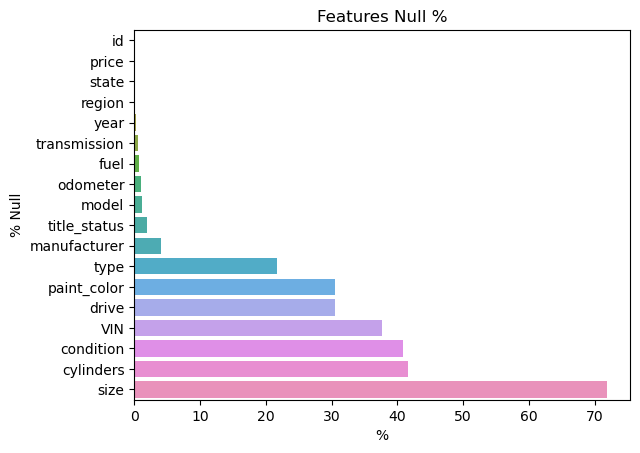

In [7]:
sns.barplot(data = veh_null, y = 'Feature', x = '%')
plt.title('Features Null %')
plt.xticks(rotation=0)
plt.ylabel('% Null')

now, let's check all the categorical columns in order to identify them well.

In [8]:
cats = ['state', 'region', 'transmission', 'fuel', 'model', 'title_status', 'manufacturer', 'type', 'paint_color', 'drive', 'condition', 'cylinders']
for cat in cats:
    temp_cat_df = vehicles[cat].value_counts().reset_index().sort_values(by = 'count', ascending = False)
    display(temp_cat_df)

,state,count
0,ca,50614
1,fl,28511
2,tx,22945
3,ny,19386
4,oh,17696
5,or,17104
6,mi,16900
7,nc,15277
8,wa,13861
9,pa,13753


,region,count
0,columbus,3608
1,jacksonville,3562
2,spokane / coeur d'alene,2988
3,eugene,2985
4,fresno / madera,2983
...,...,...
399,meridian,28
400,southwest MS,14
401,kansas city,11
402,"fort smith, AR",9


,transmission,count
0,automatic,336524
1,other,62682
2,manual,25118


,fuel,count
0,gas,356209
1,other,30728
2,diesel,30062
3,hybrid,5170
4,electric,1698


,model,count
0,f-150,8009
1,silverado 1500,5140
2,1500,4211
3,camry,3135
4,silverado,3023
...,...,...
19459,cr-v lx automatic,1
19460,tacoma double cab trd 4x4,1
19461,avenger r/t 4dr sedan,1
19462,yukon xl slt suv,1


,title_status,count
0,clean,405117
1,rebuilt,7219
2,salvage,3868
3,lien,1422
4,missing,814
5,parts only,198


,manufacturer,count
0,ford,70985
1,chevrolet,55064
2,toyota,34202
3,honda,21269
4,nissan,19067
5,jeep,19014
6,ram,18342
7,gmc,16785
8,bmw,14699
9,dodge,13707


,type,count
0,sedan,87056
1,SUV,77284
2,pickup,43510
3,truck,35279
4,other,22110
5,coupe,19204
6,hatchback,16598
7,wagon,10751
8,van,8548
9,convertible,7731


,paint_color,count
0,white,79285
1,black,62861
2,silver,42970
3,blue,31223
4,red,30473
5,grey,24416
6,green,7343
7,custom,6700
8,brown,6593
9,yellow,2142


,drive,count
0,4wd,131904
1,fwd,105517
2,rwd,58892


,condition,count
0,good,121456
1,excellent,101467
2,like new,21178
3,fair,6769
4,new,1305
5,salvage,601


,cylinders,count
0,6 cylinders,94169
1,4 cylinders,77642
2,8 cylinders,72062
3,5 cylinders,1712
4,10 cylinders,1455
5,other,1298
6,3 cylinders,655
7,12 cylinders,209


Many of the data have null problems and some values of the target variable have strange values such as 0 and 1 which must be removed as they are unrealistic.

Next we need to check out our target variable 

In [9]:
price_me = vehicles['price'].mean()

In [10]:
price_df = vehicles['price'].replace(0, price_me).replace(1, price_me).to_frame()
price_df

,price
0,6000.0
1,11900.0
2,21000.0
3,1500.0
4,4900.0
...,...
426875,23590.0
426876,30590.0
426877,34990.0
426878,28990.0


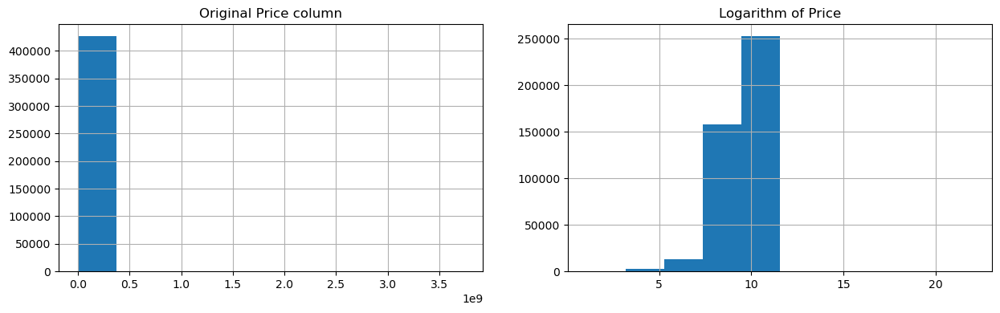

In [11]:
fig, ax = plt.subplots(1, 2, figsize = (15, 4))
ax[0].hist(price_df[['price']])
ax[0].grid()
ax[0].set_title('Original Price column')
ax[1].hist(np.log1p(price_df['price']))
ax[1].grid()
ax[1].set_title('Logarithm of Price');

<h4 style="color:Blue">Findings</h4> 

1. Many of the numeric columns can be replaced with an average (such as the year) and some of the categorical columns, such as transmission, can be replaced with the most frequent value, below is a column by column analysis.

    <span style="text-decoration:underline">id</span>: we can use this column as an index or we can drop this column, i choose drop it<br/>
    <span style="text-decoration:underline">price</span>: target variable, some prices have a value of 0, these zeros will be replaced by the mean. <br/>
    <span style="text-decoration:underline">state</span>: categorical variable without null values<br/>
    <span style="text-decoration:underline">region</span>: categorical variable without null values.<br/>
    <span style="text-decoration:underline">year</span>: we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">transmission</span>: we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">fuel</span>: we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">odometer</span>: we can average the values of all vehicles and assign this mean to the null values<br/>
    <span style="text-decoration:underline">model</span>: This feature has too many categorical values, the idea here is to eliminate the null values once we have imputed the rest of the features. I will look for a way to minimize the number of categories.<br/>
    <span style="text-decoration:underline">title_status</span>: we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">manufacturer</span>: This column has a significant amount of null values, but I think it is possible to use the most frequently used value<br/>
    <span style="text-decoration:underline">type</span>: This column is important but has almost 22% of null values, we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">paint_color</span>: we can reeplace values using the most frequently value<br/>
    <span style="text-decoration:underline">drive</span>: This column is important but has almost 30% of null values, we will apply the most frequent value as long as it does not exceed 50% of null values<br/>
    <span style="text-decoration:underline">VIN</span>: this column is a unique identifier and can be dropped<br/>
    <span style="text-decoration:underline">condition</span>: we will apply the most frequent value<br/>
    <span style="text-decoration:underline">cylinders</span>: First at all it is possible to convert this column to numerical. Second, approximately 41% of the values are null, almost 50%. I will take the risk to impute them with the most frequent value<br/>
    <span style="text-decoration:underline">size</span>: size is a value that has almost no useful values since the nulls represent 71% (> 50% null values) of the total dataset, this column should be dropped. but we will wait later if after processing the data and eliminating duplicates it is not necessary.<br/>

2. There are some records that are not really worth saving and they are all those that only have the price of the vehicle and no other data (except for the state and region), these data will be removed from the datset.
3. As we can see our target variable is somewhat skewed so we will proceed to apply a logarithmic transformation method later on if required.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

___

<h4 style="color:Blue">Development</h4> 

Once we have identified the problems in the dataset we proceed to correct them in order to have good quality data.

<h4 style="color:Blue">Imputing and Cleaning</h4>

Let's start applying the imputer for some features

In [12]:
veh_null = vehicles.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles)* 100, 2 )
veh_null

,Feature,Count,%
0,id,0,0.00
1,price,0,0.00
2,state,0,0.00
3,region,0,0.00
4,year,1205,0.28
5,transmission,2556,0.60
6,fuel,3013,0.71
7,odometer,4400,1.03
8,model,5277,1.24
9,title_status,8242,1.93


In [13]:
#Copying the data
vehicles_clean = vehicles.copy()

#Dropping useless features, outliers
vehicles_clean['price'] = vehicles_clean['price'].astype('int64')

#zscore
vehicles_clean['z_score'] = stats.zscore(vehicles_clean['price'])
zcore_index = vehicles_clean.loc[(vehicles_clean['z_score'] > 0.1)].index
vehicles_clean = vehicles_clean.drop(zcore_index)
vehicles_clean = vehicles_clean.drop(['z_score'], axis = 1)
#IQR
q1 = vehicles_clean['price'].quantile(0.25)
q3 = vehicles_clean['price'].quantile(0.75)
iqr = q3 - q1
low_lim = q1 - 0.27 * iqr
upper_lim = q3 + 2.5 * iqr
iqr_index = vehicles_clean[(vehicles_clean['price'] < low_lim) | (vehicles_clean['price'] > upper_lim)].index
vehicles_clean = vehicles_clean.drop(iqr_index)

vehicles_clean = vehicles_clean.drop(['VIN',  'id'], axis = 1)
vehicles_clean = vehicles_clean.reset_index(drop = True)

#imputing the data
imputer_trans = make_column_transformer(
    (SimpleImputer(missing_values = np.nan, strategy='mean'), ['odometer']),
    (SimpleImputer(missing_values = np.nan, strategy='most_frequent'), ['year','cylinders'])
)

vehicles_clean['cylinders'] = vehicles_clean['cylinders'].str.replace(' cylinders', '').str.replace('other', '6').str.strip()
temp_imp_cols = pd.DataFrame(imputer_trans.fit_transform(vehicles_clean), columns = ['odometer', 'year', 'cylinders'])

vehicles_clean['odometer'] = temp_imp_cols['odometer'].astype('int64')
vehicles_clean.drop(vehicles_clean.loc[vehicles_clean['odometer'] > 500000].index, inplace = True)
vehicles_clean['year'] = temp_imp_cols['year']
vehicles_clean['year'] = vehicles_clean['year'].astype('int32')
vehicles_clean['transmission'] = vehicles_clean['transmission'].fillna(vehicles_clean["transmission"].mode()[0])
vehicles_clean['fuel'] = vehicles_clean['fuel'].fillna(vehicles_clean["fuel"].mode()[0])
vehicles_clean['title_status'] = vehicles_clean['title_status'].fillna(vehicles_clean["title_status"].mode()[0])
vehicles_clean['manufacturer'] = vehicles_clean['manufacturer'].fillna(vehicles_clean["manufacturer"].mode()[0])
vehicles_clean['type'] = vehicles_clean['type'].fillna(vehicles_clean["type"].mode()[0])
vehicles_clean['paint_color'] = vehicles_clean['paint_color'].fillna(vehicles_clean["paint_color"].mode()[0])
vehicles_clean['drive'] = vehicles_clean['drive'].fillna(vehicles_clean["drive"].mode()[0])
vehicles_clean['condition'] = vehicles_clean['condition'].fillna(vehicles_clean["condition"].mode()[0])
vehicles_clean['cylinders'] =  temp_imp_cols['cylinders'].astype('int32')
vehicles_clean['model'] = vehicles_clean['model'].fillna(vehicles_clean["model"].mode()[0])
vehicles_clean['model'] = vehicles_clean['model'].str.replace('ierra', 'Sierra')
vehicles_clean['size'] = vehicles_clean['size'].fillna(vehicles_clean["size"].mode()[0])

#Cleaning models feature
def split_model(str, sep):
    tokens = str.split(sep)
    res = ''
    if len(tokens) == 1:
        res = tokens[0]
    elif(len(tokens) >= 2):
        res = f'{tokens[0]} {tokens[1]}'
    return res

vehicles_clean = vehicles_clean[~vehicles_clean['model'].isin(vehicles_clean['model'].value_counts()[vehicles_clean['model'].value_counts() < 50].index)]
vehicles_clean['model'] = vehicles_clean['model'].astype(str).apply(lambda x : split_model(x, ' '))
vehicles_clean['model'] = vehicles_clean['model'].astype(str).apply(lambda x : split_model(x, '/'))


#Dropping null data
vehicles_clean = vehicles_clean.dropna()

display(vehicles_clean)

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
0,prescott,6000,2018,ford,f-150,good,6,gas,98914,clean,automatic,4wd,full-size,sedan,white,az
1,fayetteville,11900,2018,ford,f-150,good,6,gas,98914,clean,automatic,4wd,full-size,sedan,white,ar
2,florida keys,21000,2018,ford,f-150,good,6,gas,98914,clean,automatic,4wd,full-size,sedan,white,fl
3,worcester / central MA,1500,2018,ford,f-150,good,6,gas,98914,clean,automatic,4wd,full-size,sedan,white,ma
4,greensboro,4900,2018,ford,f-150,good,6,gas,98914,clean,automatic,4wd,full-size,sedan,white,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384505,wyoming,32590,2020,mercedes-benz,c-class c,good,6,gas,19059,clean,other,rwd,full-size,sedan,white,wy
384507,wyoming,33590,2018,lexus,gs 350,good,6,gas,30814,clean,automatic,rwd,full-size,sedan,white,wy
384509,wyoming,30590,2020,volvo,s60 t5,good,6,gas,12029,clean,other,fwd,full-size,sedan,red,wy
384510,wyoming,34990,2020,cadillac,xt4 sport,good,6,diesel,4174,clean,other,4wd,full-size,hatchback,white,wy


Let's detect duplicates values and remove them

In [14]:
duplicate_count = vehicles_clean.duplicated().value_counts()
duplicates_per = round(duplicate_count[0] / len(vehicles_clean) * 100, 2)
no_duplicates_per = round(duplicate_count[1] / len(vehicles_clean) * 100, 2)
print(f"No Duplicates: {duplicate_count[0]} ({duplicates_per}%)")
print(f"Duplicates: {duplicate_count[1]} ({no_duplicates_per}%)")

No Duplicates: 237745 (87.1%)
Duplicates: 35211 (12.9%)


In [15]:
vehicles_clean = vehicles_clean.drop_duplicates()

In [16]:
vehicles_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 237745 entries, 0 to 384511
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   region        237745 non-null  object
 1   price         237745 non-null  int64 
 2   year          237745 non-null  int32 
 3   manufacturer  237745 non-null  object
 4   model         237745 non-null  object
 5   condition     237745 non-null  object
 6   cylinders     237745 non-null  int32 
 7   fuel          237745 non-null  object
 8   odometer      237745 non-null  int64 
 9   title_status  237745 non-null  object
 10  transmission  237745 non-null  object
 11  drive         237745 non-null  object
 12  size          237745 non-null  object
 13  type          237745 non-null  object
 14  paint_color   237745 non-null  object
 15  state         237745 non-null  object
dtypes: int32(2), int64(2), object(12)
memory usage: 29.0+ MB


Here we check for null values

In [17]:
veh_null = vehicles_clean.isnull().sum().sort_values().reset_index()
veh_null.columns = ['Feature', 'Count']
veh_null['%'] = round(veh_null['Count'] / len(vehicles_clean)* 100, 2)
veh_null

,Feature,Count,%
0,region,0,0.0
1,price,0,0.0
2,year,0,0.0
3,manufacturer,0,0.0
4,model,0,0.0
5,condition,0,0.0
6,cylinders,0,0.0
7,fuel,0,0.0
8,odometer,0,0.0
9,title_status,0,0.0


<h4 style="color:Blue">Correlations</h4>

Now we need to plot the correlations between numerical variables. The idea is to verify if any feature has a correlation with another in order to eliminate it.

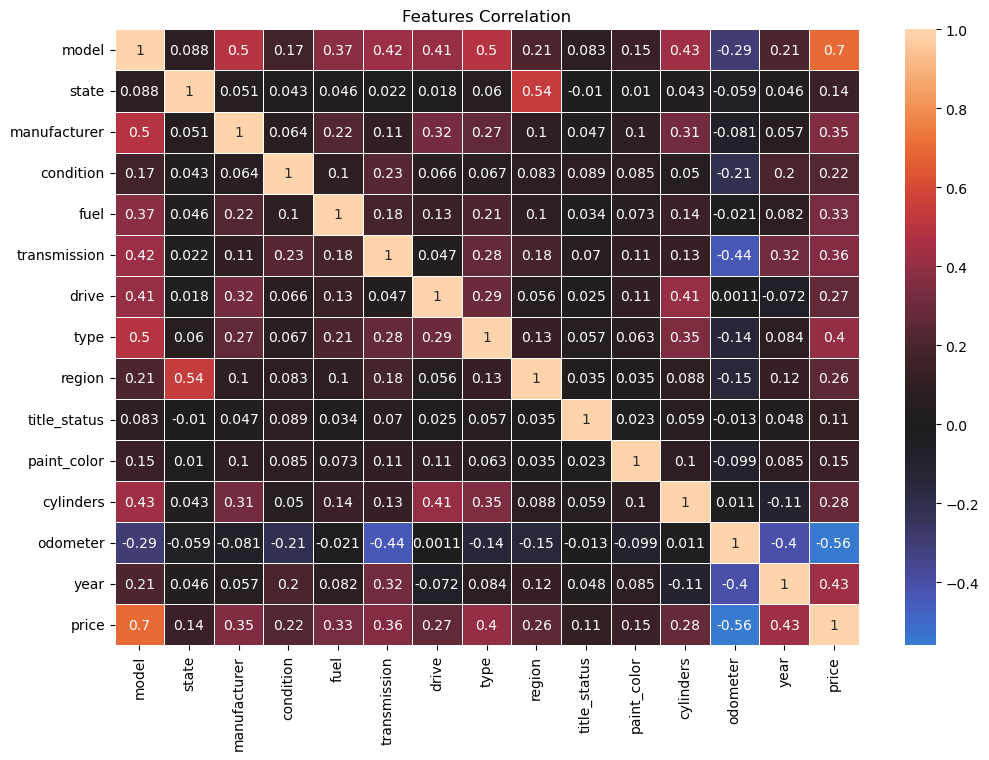

In [18]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color']
trg_enc = TargetEncoder()
vehicle_corr = pd.concat([trg_enc.fit_transform(vehicles_clean[cats] , vehicles_clean["price"]), vehicles_clean[['cylinders', 'odometer', 'year', 'price']]], axis = 1).corr()

sns.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(vehicle_corr, center = 0, linewidth = .5, annot = True).set(title='Features Correlation');

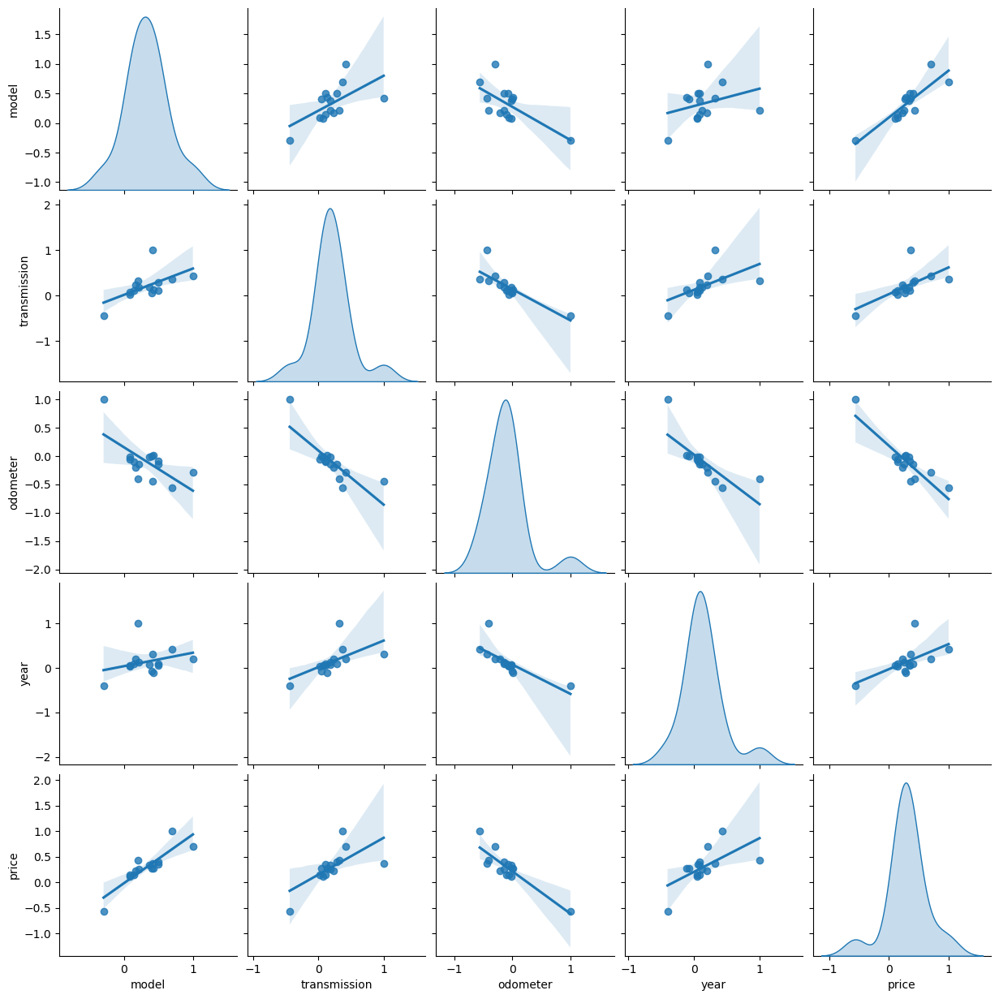

In [19]:
sns.pairplot(vehicle_corr[['model', 'transmission', 'odometer', 'year', 'price']], kind="reg", diag_kind="kde")

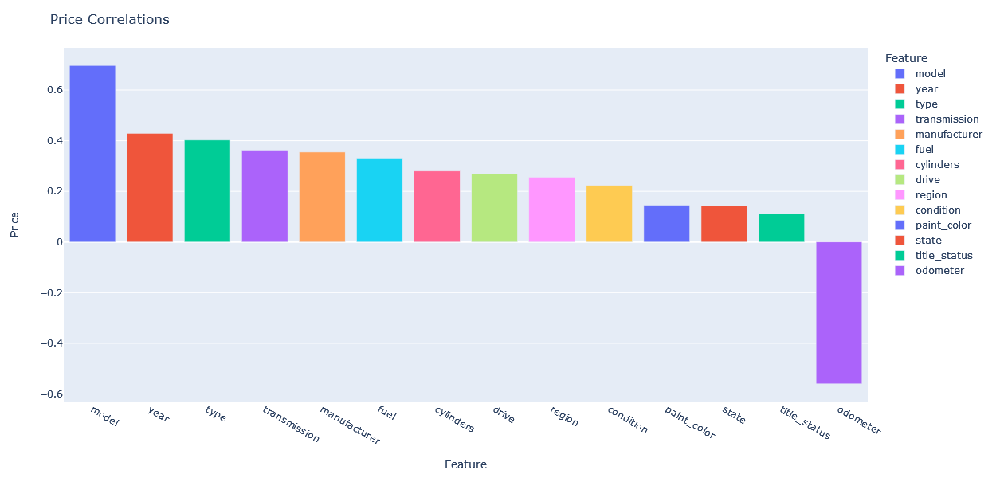

In [20]:
vehicle_corr_price = vehicle_corr[['price']].sort_values(by = 'price', ascending = False).reset_index()
fig = px.bar(vehicle_corr_price[1:], x = 'index', y = 'price', color='index', labels={'price':'Price', 'index' : 'Feature'})
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Price Correlations"
)

fig.show()

<h4 style="color:Blue">Findings</h4> 

1. Many data were imputed with the most frequent value. In the case of the odometer it is possible to use an average to fill in null values.

2. Many duplicate values were removed. Approximately 13% of the values were duplicated after all null values remaining after imputations were removed.

3. Outliers with very high values were removed using the zscore method and maximum and minimum values using IQR.

4. With respect to the model features, within the dataset there are many categories that have names with unnecessarily long texts, what was done was to cut those names in order to reduce the number of similar categories, for them if a category had one or two words it was left as it was, but if it had more than two only the first two words were left. In addition, categories with a count of less than 50 records were removed.

5. As we can see there are several correlations between characteristics that are very striking among them:

* The positive correlation between price and model is quite high indicating that a change in model is highly correlated with a change in price.
* The negative correlation between odometer and price indicates that the price goes down if the odometer is very high and vice versa, which is somewhat natural since it is an indication that the more the vehicle has been driven, the lower its value.
* There is a negative correlation between the odometer and the transmission, indicating that with a higher odometer the transmission will have more use and therefore its value and contribution to the cost of the vehicle has to go down.
* There is a positive correlation between region and state, since both are locations, it is natural to find such a relationship.

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

___

<h4 style="color:Blue">Development</h4> 

Once we have our data ready, we proceed to search for the best model, using Ridge, Lasso, LinearRegression and GridSearch to find the best possible model. I will use k-fold Cross validation.

We create a utility function to return our target variable to the real value. 

If we want to apply the log function to our target variable, we assign True to the convert variable, otherwise we assign false.

In [21]:
convert = False
def convertToReal(value, convert):
    return np.exp(value) if convert else value

def convertToLog(value, convert):
    return np.log(value) if convert else value

<h4 style="color:Blue">Splitting</h4>

In [22]:
X = vehicles_clean.drop(['price'], axis = 1)
y = convertToLog(vehicles_clean['price'], convert)

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)
X_train

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
282823,bend,2010,subaru,impreza,good,4,gas,56599,clean,manual,4wd,full-size,wagon,white,or
231925,north jersey,2001,ford,f350,excellent,6,diesel,64000,clean,automatic,4wd,full-size,pickup,red,nj
327821,austin,2000,chevrolet,s10 pickup,good,6,gas,140000,clean,manual,4wd,full-size,sedan,white,tx
175321,ann arbor,2016,chevrolet,silverado 1500,good,6,gas,29499,clean,other,4wd,full-size,pickup,silver,mi
264263,cincinnati,2016,toyota,4runner sr5,good,6,other,49940,clean,other,4wd,full-size,SUV,silver,oh
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154950,lexington,2014,lexus,is 250,good,6,gas,70113,clean,automatic,4wd,full-size,sedan,silver,ky
339907,killeen / temple / ft hood,2012,ford,fusion se,good,4,gas,199610,clean,automatic,fwd,mid-size,sedan,white,tx
54421,SF bay area,2018,mazda,3,excellent,4,gas,53000,clean,automatic,fwd,mid-size,hatchback,black,ca
184776,jackson,2016,ford,expedition el,good,6,gas,185713,clean,automatic,4wd,full-size,sedan,white,mi


In [24]:
y_train

282823    21950
231925    16500
327821     2000
175321    34590
264263    32590
          ...  
154950    23900
339907     5000
54421     15000
184776    14995
231184     7000
Name: price, Length: 166421, dtype: int64

<h4 style="color:Blue">Models</h4>

In this section we start the search for the best model

In [25]:
results = pd.DataFrame({'Model': [], 'MSE Training': [], 'MSE Dev': [], 'R2 Training': [], 'R2 Dev' : [], 'Degree': [], 'Alpha': [], 'Features': [] })
results

,Model,MSE Training,MSE Dev,R2 Training,R2 Dev,Degree,Alpha,Features


<h4 style="color:Green">Simple Linear Regression</h4>

<label style="color:Purple">Model pipeline</label>

In [26]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color', 'size']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        remainder='passthrough'
)

linear_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', LinearRegression())
        #('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
linear_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color', 'size'])])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Fitting</label>

In [27]:
linear_pipe.fit(X_train, y_train)

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color', 'size'])])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Error</label>

In [28]:
y_train_predict = convertToReal(linear_pipe.predict(X_train), convert).astype(int)
y_test_predict = convertToReal(linear_pipe.predict(X_test), convert).astype(int)
y_train_real = convertToReal(y_train, convert).astype(int)
y_test_real = convertToReal(y_test, convert).astype(int)

train_mse = mean_squared_error(y_train_real, y_train_predict)
test_mse = mean_squared_error(y_test_real, y_test_predict)
train_r2 = r2_score(y_train_real, y_train_predict)
test_r2 = r2_score(y_test_real, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Linear Regression', 
        'MSE Training': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': 'NA', 
        'Features': 'All'
    }, index=[0])])

Train MSE: 53181880.05852627
Test MSE: 54265871.073425494
Train R2: 0.705555131292048
Test R2: 0.7001543884404478


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,39475,34990
1,16749,6995
2,955,4900
3,23734,33995
4,25485,31877
...,...,...
71319,8794,7950
71320,24736,23995
71321,29575,31999
71322,14734,10950


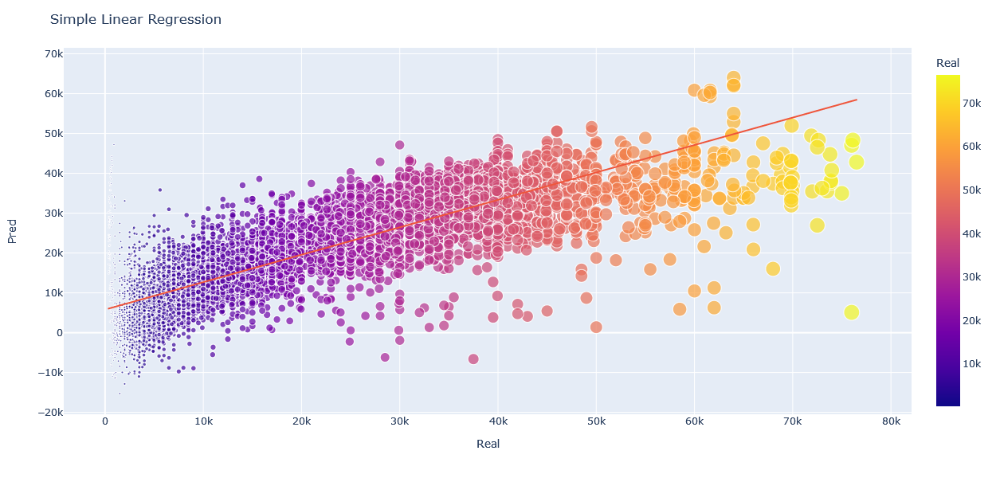

In [29]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Simple Linear Regression"
)

fig.show()

<h4 style="color:Green">Simple Linear Regression with Polynomial</h4>

<label style="color:Purple">Searching for the polynomial degree</label>

We create the pipeline to start the training. We take the polynomial grade obtained earlier and apply it to the model. We need to use a sparse matrix as there are too many categorical columns.

In [30]:
train_mses = []
test_mses = []

for i in range(1, 5):
    transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = i), make_column_selector(dtype_include=np.number)))
    pipe = Pipeline([('transformer', transf), ('linreg', LinearRegression())])
    
    pipe.fit(X_train, y_train)
    pred_train = pipe.predict(X_train)
    pred_test = pipe.predict(X_test)
    train_mse = mean_squared_error(y_train, pred_train)
    test_mse = mean_squared_error(y_test, pred_test)
    train_mses.append(train_mse)
    test_mses.append(test_mse)
    
display(train_mses)
display(test_mses)
degree = test_mses.index(min(test_mses)) + 1

[55582424.92370042, 47083500.470365405, 46963744.401388675, 81934826.24657544]

[56915875.188264504, 48225451.53620537, 48111880.3580671, 82029840.94029708]

The Complexity that minimized Test Error was: 3


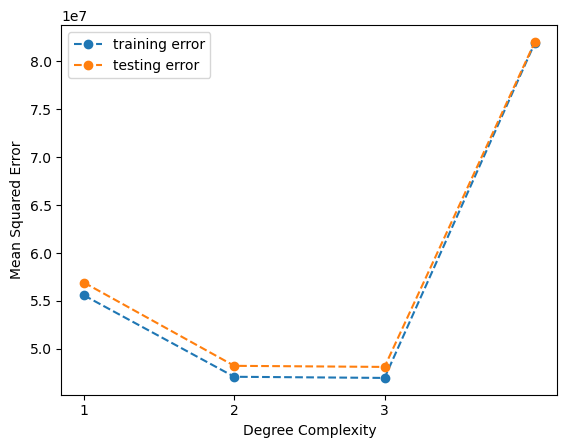

In [31]:
print(f'The Complexity that minimized Test Error was: {test_mses.index(min(test_mses)) + 1}')
plt.plot(range(1, 5), train_mses, '--o', label = 'training error')
plt.plot(range(1, 5), test_mses, '--o', label = 'testing error')
plt.xticks(range(1, 4), range(1, 4))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.legend();

<label style="color:Purple">Model Pipeline</label>

In [32]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color', 'size']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        remainder='passthrough'
)

linear_pol_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', LinearRegression())
    ])
linear_pol_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color', 'size']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(degree=3),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000016DE26BD8D0>)])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Fitting</label>

In [33]:
linear_pol_pipe.fit(X_train, y_train)

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color', 'size']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(degree=3),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000016DE26BD8D0>)])),
                ('stdscl', StandardScaler()), ('model', LinearRegression())])

<label style="color:Purple">Model Error</label>

In [34]:
y_train_predict = convertToReal(linear_pol_pipe.predict(X_train), convert).astype(int)
y_test_predict = convertToReal(linear_pol_pipe.predict(X_test), convert).astype(int)
y_train_real = convertToReal(y_train, convert).astype(int)
y_test_real = convertToReal(y_test, convert).astype(int)

train_mse = mean_squared_error(y_train_real, y_train_predict)
test_mse = mean_squared_error(y_test_real, y_test_predict)
train_r2 = r2_score(y_train_real, y_train_predict)
test_r2 = r2_score(y_test_real, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Linear Regression with Polynomial', 
        'MSE Training': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': degree, 
        'Alpha': 'NA', 
        'Features': 'All'
    }, index=[1])])

Train MSE: 42968654.86246327
Test MSE: 43946290.34225506
Train R2: 0.7621013035715928
Test R2: 0.7571751444730781


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,38755,34990
1,13890,6995
2,1688,4900
3,21771,33995
4,27950,31877
...,...,...
71319,8647,7950
71320,23619,23995
71321,27215,31999
71322,8392,10950


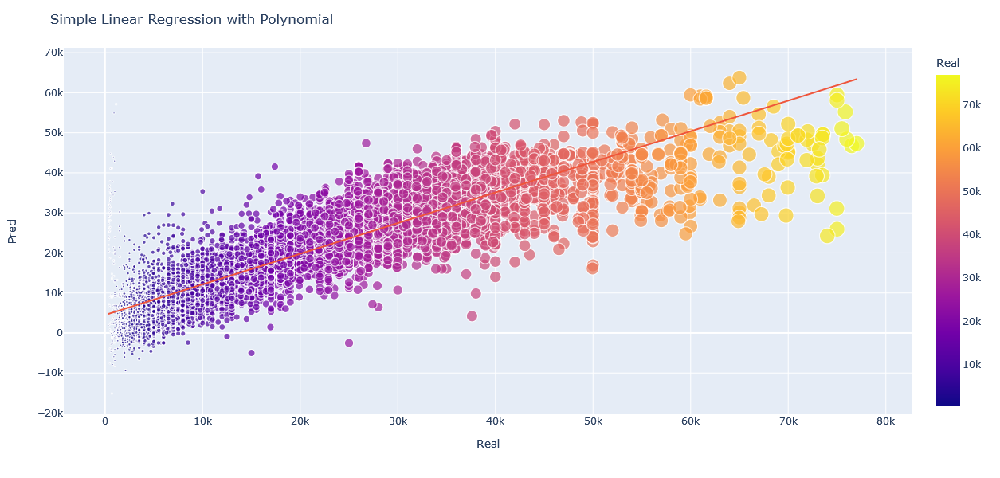

In [35]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Simple Linear Regression with Polynomial"
)

fig.show()

<h4 style="color:Green">Ridge with Polynomial</h4>

<label style="color:Purple">Model Pipeline</label>

In [36]:
cats = ['model' , 'state', 'manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'region', 'title_status', 'paint_color', 'size']
transf = make_column_transformer(
        (TargetEncoder(), cats),
        (PolynomialFeatures(degree = degree), make_column_selector(dtype_include=np.number)),
        remainder='passthrough'
)

rid_pipe = Pipeline(
    [
        ('transf', transf),
        ('stdscl', StandardScaler()),
        ('model', Ridge())
        #('regressor', TransformedTargetRegressor(regressor = Ridge(), func=np.log10, inverse_func=exp10))
    ])
rid_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('targetencoder',
                                                  TargetEncoder(),
                                                  ['model', 'state',
                                                   'manufacturer', 'condition',
                                                   'fuel', 'transmission',
                                                   'drive', 'type', 'region',
                                                   'title_status',
                                                   'paint_color', 'size']),
                                                 ('polynomialfeatures',
                                                  PolynomialFeatures(degree=3),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000016DE7130790>)])),
                ('stdscl', StandardScaler()), ('model', Ridge())])

<label style="color:Purple">Model Fitting</label>

In [37]:
%%time
alpha = np.logspace(-5, 10, 10)
rid_param_dict = {'model__alpha': alpha}
rid_grid = GridSearchCV(rid_pipe, param_grid=rid_param_dict, scoring = 'neg_mean_squared_error')
rid_grid.fit(X_train, y_train)
best_estimator = rid_grid.best_estimator_

CPU times: total: 1min 44s
Wall time: 43.1 s


<label style="color:Purple">Model Error</label>

In [38]:
y_train_predict = convertToReal(best_estimator.predict(X_train), convert).astype(int)
y_test_predict = convertToReal(best_estimator.predict(X_test), convert).astype(int)
y_train_real = convertToReal(y_train, convert).astype(int)
y_test_real = convertToReal(y_test, convert).astype(int)

train_mse = mean_squared_error(y_train_real, y_train_predict)
test_mse = mean_squared_error(y_test_real, y_test_predict)
train_r2 = r2_score(y_train_real, y_train_predict)
test_r2 = r2_score(y_test_real, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

rid_best_regressor = best_estimator.named_steps['model']
print(f'Best alpha: {rid_best_regressor.alpha}')
print(f'Score: {np.abs(rid_grid.best_score_)}')

alpha = rid_best_regressor.alpha

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Ridge with Polynomial', 
        'MSE Training': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': degree, 
        'Alpha': alpha, 
        'Features': 'All'
    }, index=[3])])
best_estimator_final = best_estimator

Train MSE: 43055358.60036895
Test MSE: 43946939.73961079
Train R2: 0.7616212628002619
Test R2: 0.7571715562334826
Best alpha: 1e-05
Score: 45082757.98448273


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,38794,34990
1,13874,6995
2,1667,4900
3,22014,33995
4,27850,31877
...,...,...
71319,8656,7950
71320,23699,23995
71321,27287,31999
71322,8873,10950


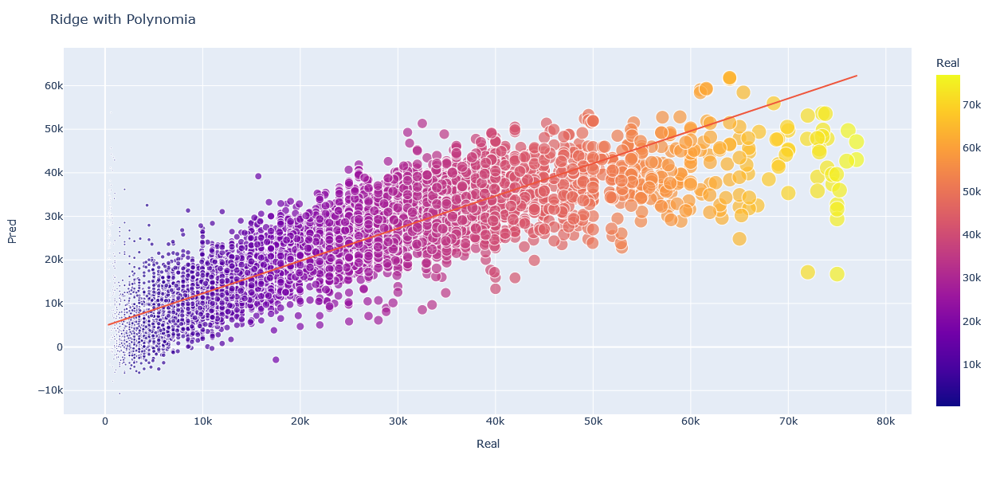

In [39]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Ridge with Polynomia"
)

fig.show()

<h4 style="color:Green">Lasso, SequentialFeatureSelector with Polynomial</h4>

<label style="color:Purple">Model Pipeline</label>

In [40]:
transf = make_column_transformer(
        (PolynomialFeatures(degree = degree, include_bias = False), make_column_selector(dtype_include=np.number)))
    
lasso_pol_pipe = Pipeline([('transf', transf),
                 ('selector', SequentialFeatureSelector(Lasso())),
                 ('lasmodel', Lasso())])
lasso_pol_pipe

Pipeline(steps=[('transf',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=3,
                                                                     include_bias=False),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000016DE71425D0>)])),
                ('selector', SequentialFeatureSelector(estimator=Lasso())),
                ('lasmodel', Lasso())])

<label style="color:Purple">Model Fitting</label>

In [41]:
%%time
n_feat = [4,5,6]
param_dict = {'selector__n_features_to_select' : n_feat}
grid = GridSearchCV(lasso_pol_pipe, param_grid=param_dict, scoring = 'neg_mean_squared_error')
grid.fit(X_train, y_train)
best_estimator = grid.best_estimator_

CPU times: total: 36min 5s
Wall time: 5min 3s


<label style="color:Purple">Model Error</label>

In [42]:
best_selector = best_estimator.named_steps['selector']
best_model = best_estimator.named_steps['lasmodel']
best_transf = best_estimator.named_steps['transf']

y_train_predict = convertToReal(best_estimator.predict(X_train), convert).astype(int)
y_test_predict = convertToReal(best_estimator.predict(X_test), convert).astype(int)
y_train_real = convertToReal(y_train, convert).astype(int)
y_test_real = convertToReal(y_test, convert).astype(int)
#y_test_predict = y_test_predict.astype(int)

train_mse = mean_squared_error(y_train_real, y_train_predict)
test_mse = mean_squared_error(y_test_real, y_test_predict)
train_r2 = r2_score(y_train_real, y_train_predict)
test_r2 = r2_score(y_test_real, y_test_predict)

print(f'Train MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Train R2: {train_r2}')
print(f'Test R2: {test_r2}')

print(f'Best alpha: {best_model.alpha}')
print(f'Score: {np.abs(grid.best_score_)}')

feature_names = best_transf.get_feature_names_out()[best_selector.get_support()]
display(pd.DataFrame({'Selected Columns:': [cols.replace('polynomialfeatures__', '') for cols in feature_names]}))

results = pd.concat([
    results, pd.DataFrame({
        'Model':'Lasso, SequentialFeatureSelector with Polynomial', 
        'MSE Training': train_mse, 
        'MSE Dev': test_mse,
        'R2 Training': train_r2,
        'R2 Dev': test_r2,
        'Degree': 'NA', 
        'Alpha': best_model.alpha, 
        'Features': len(feature_names)
    }, index=[3])])

Train MSE: 85950126.45589198
Test MSE: 86373562.71914083
Train R2: 0.5241316464952689
Test R2: 0.5227436098638252
Best alpha: 1.0
Score: 90121447.55446121


,Selected Columns:
0,year
1,odometer
2,year^3
3,year^2 cylinders
4,year cylinders odometer
5,year odometer^2


<label style="color:Purple">Prediction Plot</label>

,Pred,Real
0,31151,34990
1,7720,6995
2,4429,4900
3,26096,33995
4,27493,31877
...,...,...
71319,14225,7950
71320,21190,23995
71321,22142,31999
71322,23675,10950


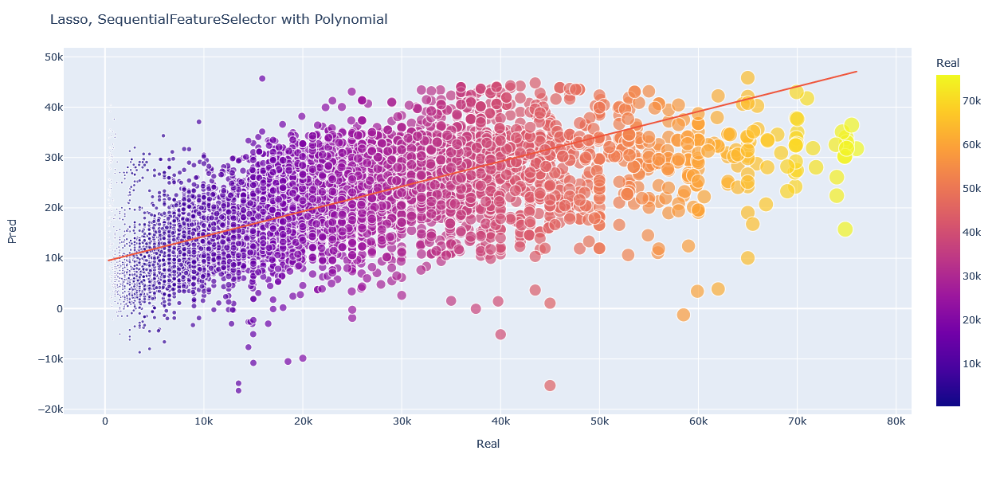

In [43]:
plot_df = pd.concat([
    pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), 
                 columns = ['Pred']), 
    pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)])

pred_df = pd.DataFrame(y_test_predict.reshape(len(y_test_predict), 1), columns = ['Pred'])
real_df = pd.DataFrame({'Real':y_test_real}).reset_index().drop('index', axis = 1)
plot_df = pd.concat([pred_df, real_df], axis=1)

display(plot_df)
fig = px.scatter(plot_df.loc[plot_df['Pred'] < 1000000].sample(10000),  x = 'Real', y = 'Pred', size='Real', color="Real", trendline="ols")

fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Lasso, SequentialFeatureSelector with Polynomial"
)

fig.show()

<h4 style="color:Blue">Notes</h4> 

For the search of our best model we trained 4 different models in order to verify the one that performs best in order to make the best prediction. Those using GridSerachCV use k-fold as cross validation.

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

____


<h4 style="color:Blue">Development</h4> 

We proceed to evaluate our model to verify if it is really good at making predictions.

<h4 style="color:Blue">MSE Evaluation</h4> 

Here we evaluate the best MSE and best R2

In [44]:
results

,Model,MSE Training,MSE Dev,R2 Training,R2 Dev,Degree,Alpha,Features
0,Linear Regression,5.318188e+07,5.426587e+07,0.705555,0.700154,NA,NA,All
1,Linear Regression with Polynomial,4.296865e+07,4.394629e+07,0.762101,0.757175,3,NA,All
3,Ridge with Polynomial,4.305536e+07,4.394694e+07,0.761621,0.757172,3,0.00001,All
3,"Lasso, SequentialFeatureSelector with Polynomial",8.595013e+07,8.637356e+07,0.524132,0.522744,NA,1.0,6


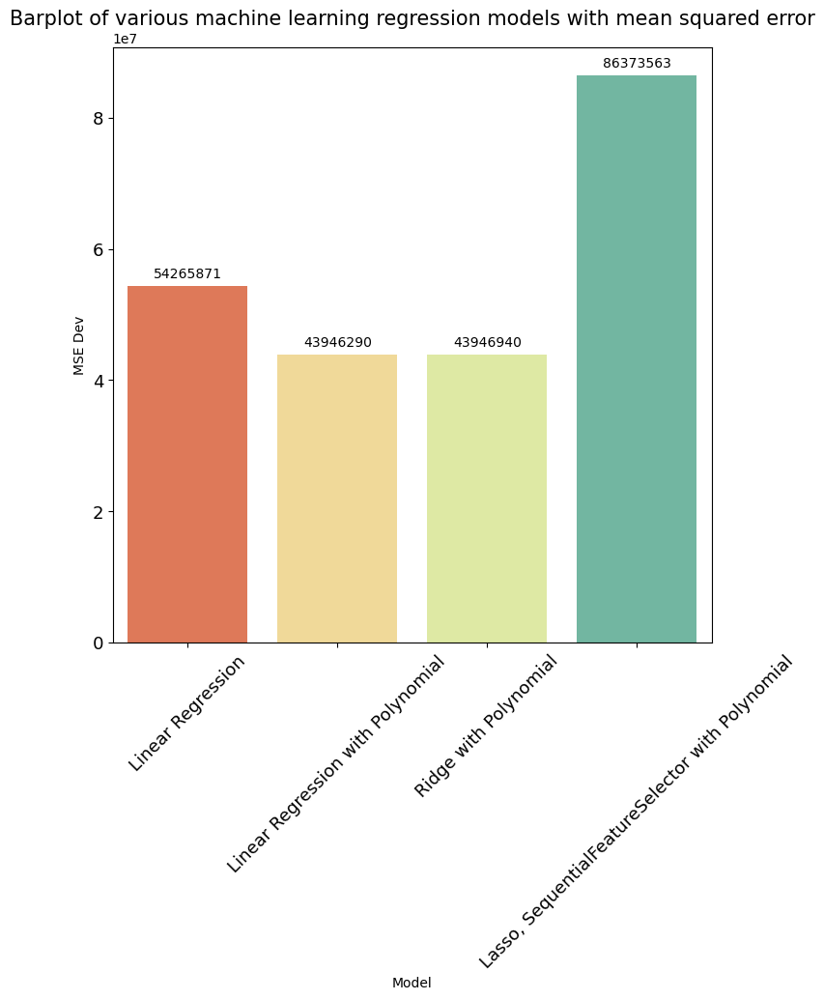

In [45]:
plt.figure(figsize = (8, 8))
fig = sns.barplot(data = results, x = 'Model', y = 'MSE Dev', palette = 'Spectral')
for p in fig.patches:
    fig.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xticks(fontsize = 13, rotation=45)
plt.yticks(fontsize = 13)
plt.title("Barplot of various machine learning regression models with mean squared error", fontsize = 15)
plt.show()

<h4 style="color:Blue">R2 Evaluation</h4> 

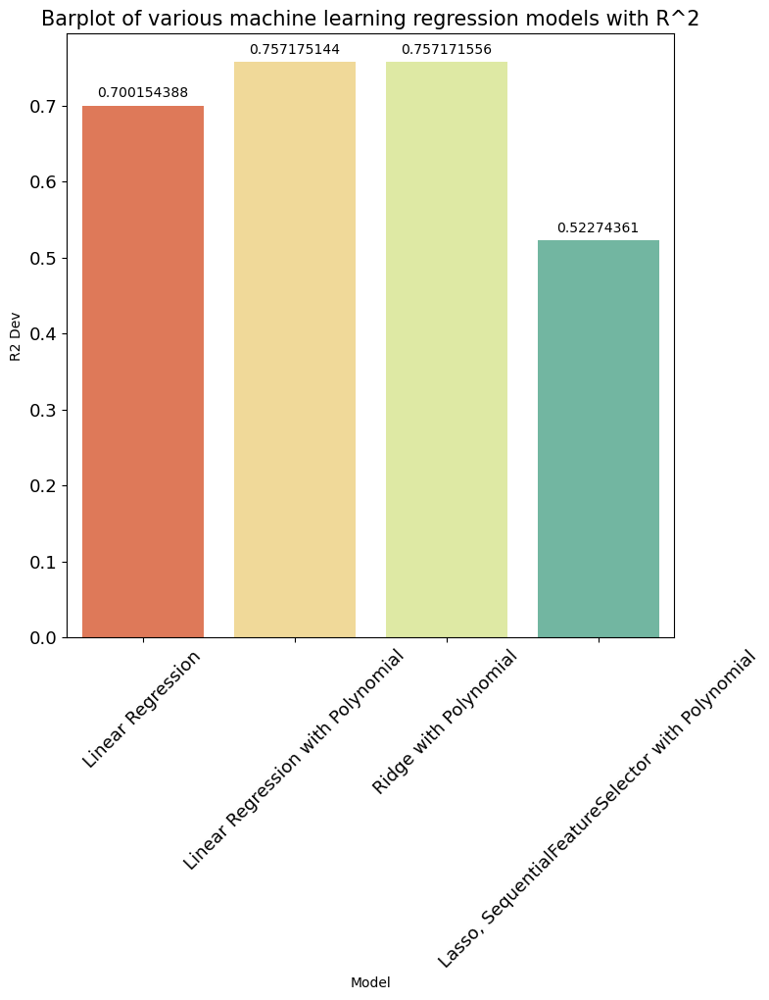

In [46]:
plt.figure(figsize = (8, 8))
fig = sns.barplot(data = results, x = 'Model', y = 'R2 Dev', palette = 'Spectral')
for p in fig.patches:
    fig.annotate(round(p.get_height(),9), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xticks(fontsize = 13, rotation=45)
plt.yticks(fontsize = 13)
plt.title("Barplot of various machine learning regression models with R^2", fontsize = 15)
plt.show()


<h4 style="color:Blue">Feature Weight</h4> 

Here we look for which characteristics have a considerable weight in the price calculation, for that we will use permutation importance

In [47]:
%%time
importances = permutation_importance(best_estimator_final, X_train, y_train, n_repeats = 10, random_state=40)

CPU times: total: 41 s
Wall time: 41.4 s


In [48]:
importances_tr = dict(zip(X_train.columns, importances.importances_mean))
display(importances_tr)
importances_tr = {k : v for k ,v in sorted(importances_tr.items(), key = lambda x: x[1], reverse = True)}
display(importances_tr)

import_df = pd.DataFrame(importances_tr.values(), index=importances_tr.keys(), columns = ['Importances'])
display(import_df)

{'region': 0.0025815599828883373,
 'year': 0.3325022003654694,
 'manufacturer': 0.0013302234483446474,
 'model': 0.30411307067966364,
 'condition': 0.00046271939554327625,
 'cylinders': 0.04172694965386031,
 'fuel': 0.03202487415158335,
 'odometer': 0.10783103207172773,
 'title_status': 0.005727599596908295,
 'transmission': 0.04979133838405673,
 'drive': 0.0030274568366711607,
 'size': 3.0139583924326806e-05,
 'type': 0.010752769782379535,
 'paint_color': 8.214265770689622e-07,
 'state': 0.0009971348032576598}

{'year': 0.3325022003654694,
 'model': 0.30411307067966364,
 'odometer': 0.10783103207172773,
 'transmission': 0.04979133838405673,
 'cylinders': 0.04172694965386031,
 'fuel': 0.03202487415158335,
 'type': 0.010752769782379535,
 'title_status': 0.005727599596908295,
 'drive': 0.0030274568366711607,
 'region': 0.0025815599828883373,
 'manufacturer': 0.0013302234483446474,
 'state': 0.0009971348032576598,
 'condition': 0.00046271939554327625,
 'size': 3.0139583924326806e-05,
 'paint_color': 8.214265770689622e-07}

,Importances
year,3.325022e-01
model,3.041131e-01
odometer,1.078310e-01
transmission,4.979134e-02
cylinders,4.172695e-02
fuel,3.202487e-02
type,1.075277e-02
title_status,5.727600e-03
drive,3.027457e-03
region,2.581560e-03


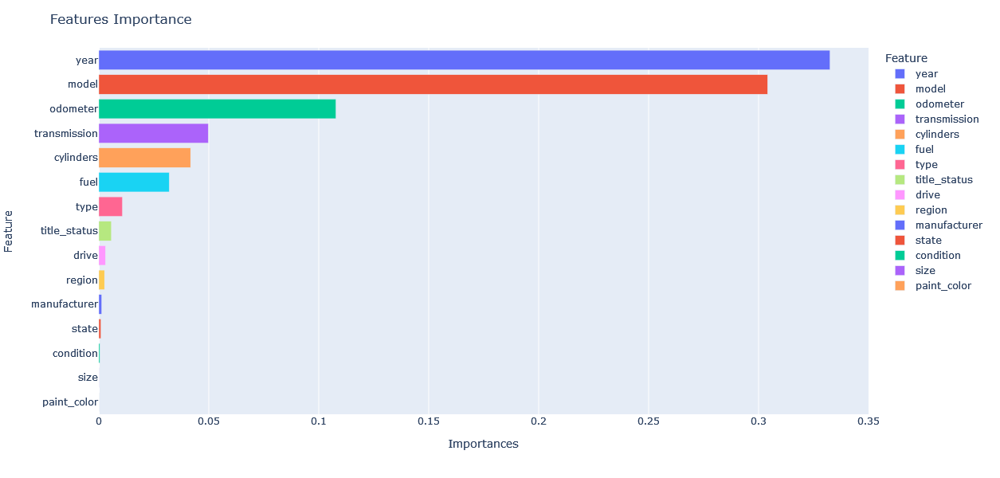

In [49]:
fig = px.bar(import_df.reset_index(), x="Importances", y = 'index', color='index', labels={'index' : 'Feature'})
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title="Features Importance"
)
fig.show()

In [50]:
best_scaler = best_estimator_final.named_steps['stdscl']
best_transf = best_estimator_final.named_steps['transf']
best_model = best_estimator_final.named_steps['model']
coefs = best_model.coef_
feat_names = [cols.replace('polynomialfeatures__', '').replace('targetencoder__', '') for cols in best_transf.get_feature_names_out()]

In [51]:
coefs_tr = dict(zip(feat_names, coefs))
coefs_tr = {k : v for k ,v in sorted(coefs_tr.items(), key = lambda x: x[1], reverse = True)}

coefs_df = pd.DataFrame(coefs_tr.values(), index=coefs_tr.keys(), columns = ['Coef']).reset_index().rename(columns={'index': 'Feature'})

display(coefs_df)

,Feature,Coef
0,year^3,2.689047e+07
1,year,2.637321e+07
2,year odometer,1.088643e+07
3,year^2 cylinders,7.757495e+06
4,cylinders,7.606140e+06
5,year cylinders odometer,8.895036e+04
6,year cylinders^2,6.231274e+04
7,odometer^2,1.837615e+04
8,model,5.236364e+03
9,fuel,1.697789e+03


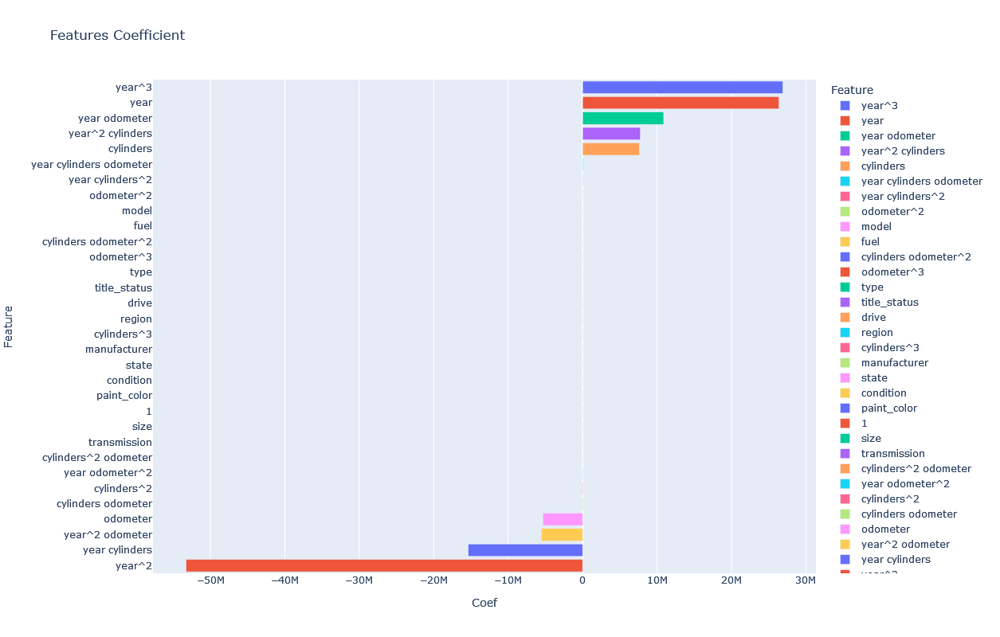

In [52]:
fig = px.bar(coefs_df, y="Feature", x="Coef", title="Gráfico de barras horizontales", color='Feature')
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    title="Features Coefficient"
)
fig.show()

<h4 style="color:Blue">Findings</h4> 

1. For the training I used 4 different models in order to find the most optimal one:
* Simple Linear Regression
* Simple Linear Regression with Polynomial
* Ridge with Polynomial
* Lasso, SequentialFeatureSelector with Polynomial

    I used MSE and R2 as I am more interested in penalizing large errors in my model in order for my metric to reflect the true accuracy of my model.
For this search I tried using a logarithmic and non-logarithmic target variable and obtained the following results:
'Simple Linear Regression with Polynomial' and 'Ridge with Polynomial' were the best scoring models followed by the 'Simple Linear Regression' model and 'Lasso' in last place. All these calculations were done for both logarithmic and non-logarithmic target variables. The interesting thing about the results is that my error was much lower using a non-logarithmic target variable.

2. In the search for weights for each of the characteristics I found that the year, model, odometer, transmission and cylinders of the vehicle have a very large influence on the prediction of the values, while the color, size and condition are not so decisive when calculating the price of the vehicles. In addition, we can see that the coefficients of a model with one of the best scores  (Ridge with Polynomial) have marked extremes where the year and model and the combination of year-odometer and year-cylinders predominate, giving us an indication of the weight that these characteristics have at the time of predicting the price

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

In [53]:
def createBarColorfulPlot(data, title, x_name, y_name, x_label, y_label, rotation = 45):
    # Plotting
    plt.figure(figsize=(12, 6))  # Optional: Adjusts the size of the plot
    ax = sns.barplot(data=data, x=x_name, y=y_name, palette = 'cool')
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)

    # Get current axis tick labels
    xlabels = [label.get_text() for label in plt.gca().get_xticklabels()]
    ylabels = [label.get_text() for label in plt.gca().get_yticklabels()]

    # Format each number with commas and a dollar sign
    y_formatted_numbers = [f'${int(num):,.0f}' for num in ylabels]
    
    # Capitalize each label
    capitalized_labels = [label.capitalize() for label in xlabels]

    # Set the modified labels back on the x-axis
    plt.gca().set_xticklabels(capitalized_labels)
    plt.gca().set_yticklabels(y_formatted_numbers)

    plt.xticks(rotation=rotation)
    
    # Annotate each bar with the value
    for p in ax.patches:
        ax.annotate('${:,.0f}'.format(p.get_height()),
        (p.get_x() + p.get_width() / 2., p.get_height()+0.1),
        ha = 'center', va = 'top',
        xytext = (10, 40),
        textcoords = 'offset points',
        rotation=45)
    
    
    # Despine the plot and show the final result
    sns.despine()
    plt.tight_layout()
    plt.show()
    #plt.savefig(f"{title}.png", dpi=300)

<h4 style="color:Green">Client Report</h4>

Dear client, thank you for hiring my services, in my quest to improve the services you offer I would like to give you a report that shows how you could improve your sales and allow you to increase your profits. 

For this I will start a detailed analysis analyzing the most important variables so you know how to improve your business.

First of all, in my analysis I found that features such as year, model, odometer, cylinders and transmission are very important when pricing your vehicles, so I will show you which are the best features for your business and knowing them you can make good decisions for the future. This is valuable piece of information I would like you to keep in mind.

Second, the analysis and results presented are a guide and at no time are they an absolute truth, my intention is that these numbers serve as a guide in the best decisions for your business.

<label style="color:Purple">Average Car Price by Year</label>

Let's start with the year and the average price of each of the years analyzed, as you can see the cars between the years 1900 and 1970 (omitting the war period of the second world war and 5 years after) tend to have quite high prices compared to subsequent years, especially the years 1900 and 1933, I recommend you to negotiate with that kind of cars. For the years between 2011 onwards there is also an interesting price increase, but mostly it is due to the fact that these cars increase in price because they have a lower odometer the newer the vehicle is.


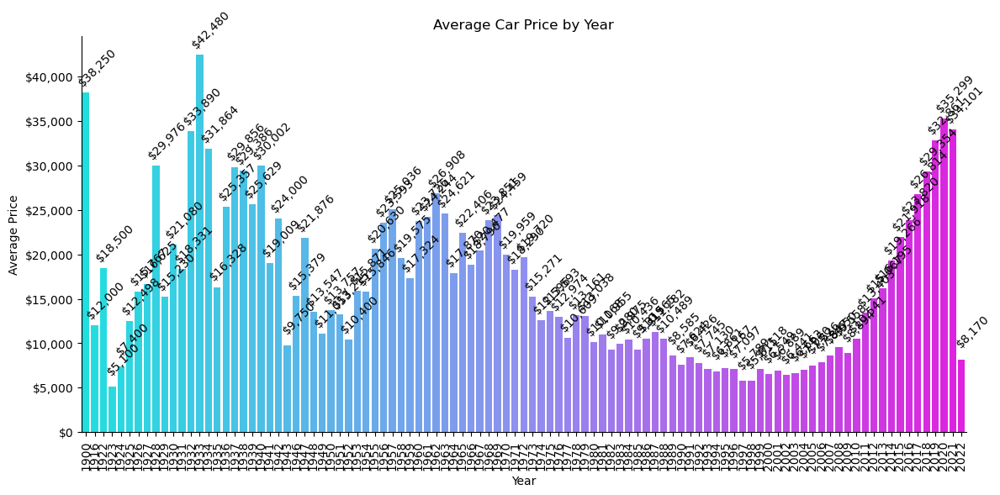

In [54]:
plot_data = vehicles_clean.groupby('year')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data, 'Average Car Price by Year', 'year', 'price', 'Year', 'Average Price', 90)

<label style="color:Purple">Average Car Price by Model</label>

In this chart I show you the top 15 models of vehicles that have the highest average price, among these we find Audi's Q8 or BMW's M4, also trucks like the Ford f-150 and GMC's Sierra 1500. The first vehicles on the list are high-end vehicles that have high prices so they may not have as fast an exit as vehicles with more affordable prices.


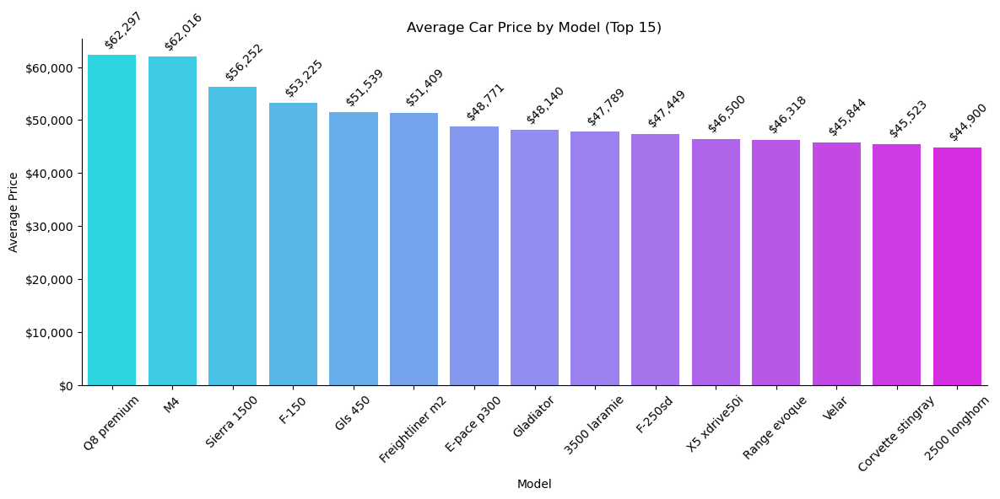

In [55]:
plot_data = vehicles_clean.groupby('model')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data[:15], 'Average Car Price by Model (Top 15)', 'model', 'price', 'Model', 'Average Price')

<label style="color:Purple">Average Car Price by Manufacturer</label>

The average selling price by brand can be seen in this graph, as you can see the highest prices correspond to high-end vehicles such as Tesla, Jaguar, Porsche and others, while the most economical vehicles belong to brands such as Kia, Hyundai, Honda and others. This graph will allow you to have a higher vision of which vehicles to sell in case you specialize in the high, medium or low range segment.

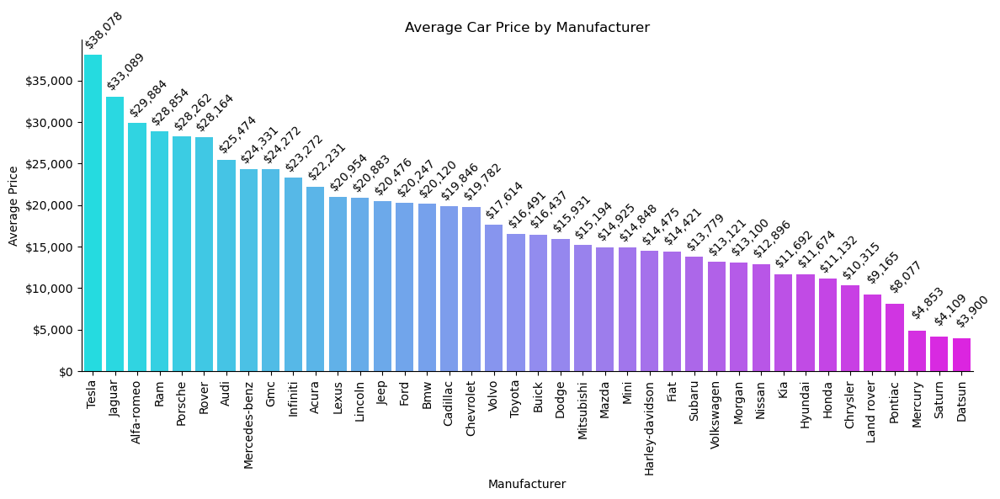

In [56]:
plot_data = vehicles_clean.groupby('manufacturer')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data, 'Average Car Price by Manufacturer', 'manufacturer', 'price', 'Manufacturer', 'Average Price', 90)

<label style="color:Purple">Average Car Price by Transmission</label>

Manual transmissions are usually cheaper than automatic transmissions, here you can see the average selling price of a vehicle with automatic vs. manual transmission. Automatic transmissions have a higher price per vehicle due to their greater complexity, so this chart will help you decide if it is more profitable to sell vehicles with manual or automatic transmissions, or a balance of both.

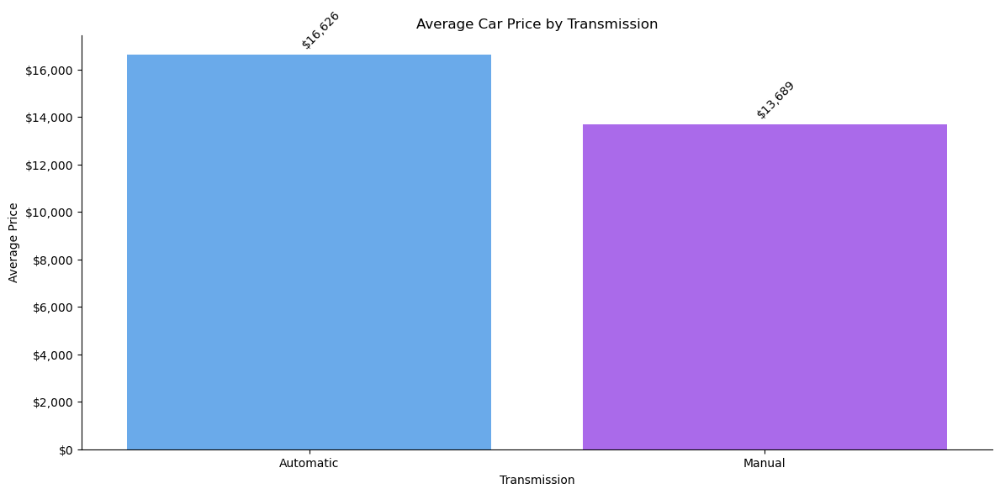

In [57]:
plot_data = vehicles_clean.groupby('transmission')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data.loc[plot_data['transmission'].isin(['automatic', 'manual'])], 'Average Car Price by Transmission', 'transmission', 'price', 'Transmission', 'Average Price', 0)

<label style="color:Purple">Average Car Price by Odometer Range</label>

The odometer section is interesting because as you know the more mileage a vehicle has the more it tends to devalue, unless they are classic cars which we were able to check the prices in a previous graph.  In general, the more mileage a vehicle has the lower its selling price, with the exception of some classic cars.

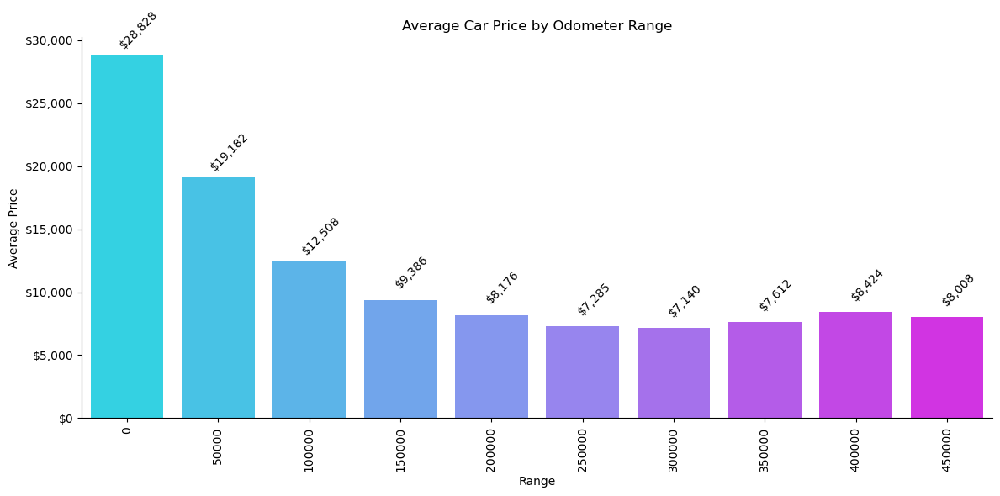

In [58]:
plot_data_odo = vehicles_clean.copy()[['odometer', 'price']]
min_odo = plot_data_odo['odometer'].min()
max_odo = plot_data_odo['odometer'].max()

# Creates ranges using odometer value
range_w = (max_odo - min_odo) / 10
bn = np.arange(min_odo, max_odo, range_w)
bn = np.append(bn, max_odo)
labels = bn[:-1].astype(int)

plot_data_odo['odometer_range'] = pd.cut(plot_data_odo['odometer'], bins=bn, labels=labels, include_lowest=True)
plot_data = plot_data_odo.groupby('odometer_range')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data, 'Average Car Price by Odometer Range', 'odometer_range', 'price', 'Range', 'Average Price', 90)

<label style="color:Purple">Average Car Price by Cylinders</label>

Vehicles with 8 cylinders tend to have a higher average price than the others, they are likely to be more desirable because of their power-consumption ratio, so as demand increases, the price is likely to rise. 

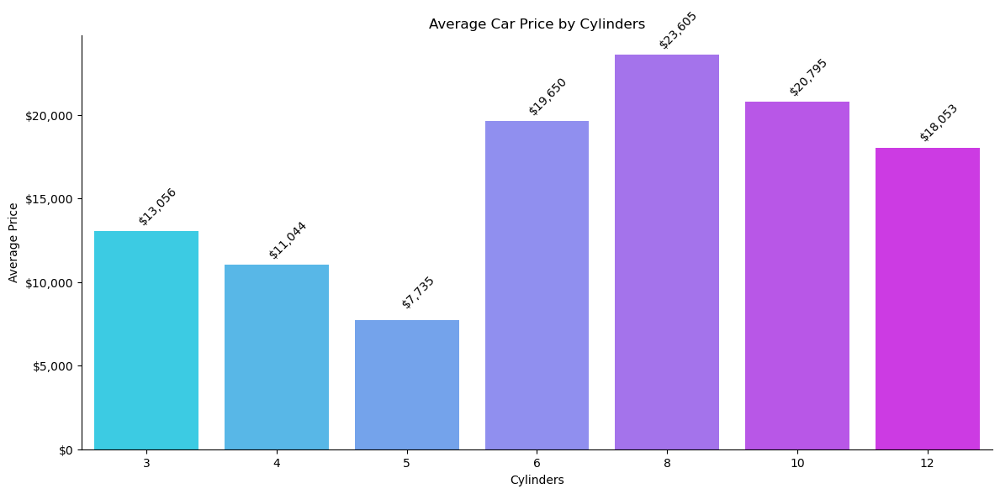

In [59]:
plot_data = vehicles_clean.groupby('cylinders')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data, 'Average Car Price by Cylinders', 'cylinders', 'price', 'Cylinders', 'Average Price', 0)

<label style="color:Purple">Average Car Price by State</label>

Finally I would like to show you a graph with the average selling price in each of the states of the USA (it is not a feature with great influence on the price of the vehicle but it is interesting), it is an interesting data because it can be a determining factor when investing and creating a new business and this information will help you to decide the place where you could start a new business or headquarters. 

West Virginia stands out as the state with the highest sales prices and Rhode Island has the lowest average prices. Deciding on one or the other depends on many factors and not only the price, but you should also include taxes, salaries and fixed costs, but this will give you a small glimpse of what is going on and allow you to make valuable decisions.

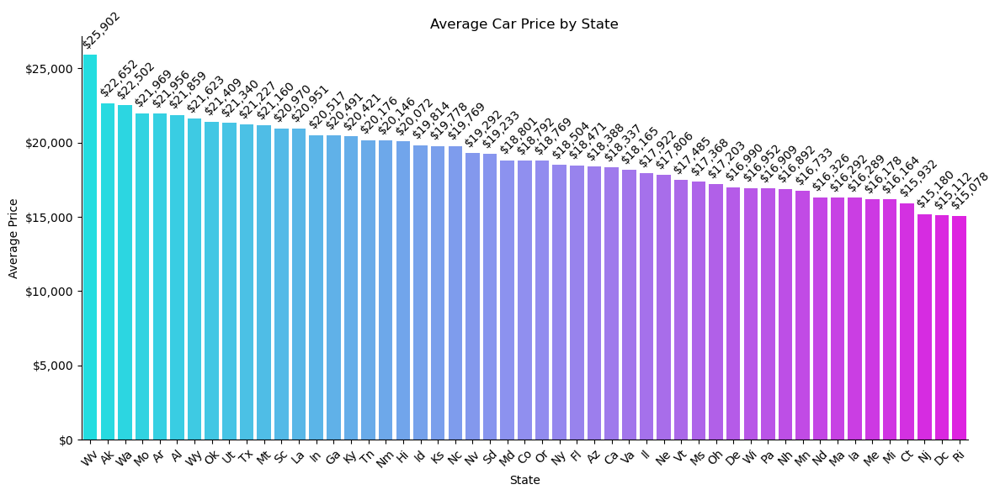

In [60]:
plot_data = vehicles_clean.groupby('state')['price'].mean().reset_index()
plot_data = plot_data.sort_values(by='price', ascending=False)
createBarColorfulPlot(plot_data, 'Average Car Price by State', 'state', 'price', 'State', 'Average Price')

<h4 style="color:Blue">Findings</h4> 

1. The year of manufacture of the vehicle is very influential in the prediction of the price, the model also presents the same behavior.
2. The odometer is diametrically opposed to the price, the more distance traveled, the lower the value of the vehicle, with the exception of classic cars.
3. In spite of what it may seem the color of the vehicle, the condition and the size does not influence the price prediction as much.
4. There are some states where prices are higher, this is probably due to several factors such as taxes, salaries, preference for certain brands among others.